# 2 - Segmentation des données
---

**Imports des données**

In [1]:
import datetime as dt
import numpy as np
import json
import pprint
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

df_rfm = pd.read_csv('data/df_rfm.csv', index_col='customer_unique_id')

In [2]:
df_rfm.sample(5)

,Recency,Frequency,MonetaryValue
customer_unique_id,,,
e65b257f04910e6740f92359febbe57a,162,1,110.10
ebfa7b208d48a86c037760d5676584b7,219,1,27.79
0b4ea0237786c5d1c034ebb2f27ccbd7,113,1,143.76
df35be9e0ff99010ae164dd4c5920dc6,202,1,250.70
eaa7b2692a101caba7c02906259231d6,79,1,48.30


**Rules based Clustering**

In [ ]:
df_rfm_rb = df_rfm.copy()

In [3]:
#level_recency = np.max(df_rfm_rb["Recency"])/2
#level_frequency = np.max(df_rfm_rb["Frequency"])/2
#level_monetaryValue = np.max(df_rfm_rb["MonetaryValue"])/2

In [4]:
level_recency = np.median(df_rfm_rb["Recency"])
level_frequency = np.median(df_rfm_rb["Frequency"])
level_monetaryValue = np.median(df_rfm_rb["MonetaryValue"])

In [5]:
index_label_0 = df_rfm_rb.query('Recency < @level_recency and Frequency < @level_frequency and MonetaryValue < @level_monetaryValue').index
index_label_1 = df_rfm.query('Recency < @level_recency and Frequency < @level_frequency and MonetaryValue >= @level_monetaryValue').index
index_label_2 = df_rfm_rb.query('Recency >= @level_recency and Frequency < @level_frequency and MonetaryValue < @level_monetaryValue').index
index_label_3 = df_rfm_rb.query('Recency >= @level_recency and Frequency >= @level_frequency and MonetaryValue >= @level_monetaryValue').index
index_label_4 = df_rfm_rb.query('Recency >= @level_recency and Frequency >= @level_frequency and MonetaryValue < @level_monetaryValue').index
index_label_5 = df_rfm_rb.query('Recency >= @level_recency and Frequency < @level_frequency and MonetaryValue >= @level_monetaryValue').index
index_label_6 = df_rfm_rb.query('Recency < @level_recency and Frequency >= @level_frequency and MonetaryValue >= @level_monetaryValue').index
index_label_7 = df_rfm_rb.query('Recency < @level_recency and Frequency >= @level_frequency and MonetaryValue < @level_monetaryValue').index

In [6]:
#Separation en 8 classes arbitraires
df_rfm_rb.loc[index_label_0, ['Label']] = 0
df_rfm_rb.loc[index_label_1, ['Label']] = 1
df_rfm_rb.loc[index_label_2, ['Label']] = 2
df_rfm_rb.loc[index_label_3, ['Label']] = 3
df_rfm_rb.loc[index_label_4, ['Label']] = 4
df_rfm_rb.loc[index_label_5, ['Label']] = 5
df_rfm_rb.loc[index_label_6, ['Label']] = 6
df_rfm_rb.loc[index_label_7, ['Label']] = 7

In [7]:
import plotly.express as px

fig = px.scatter_3d(df_rfm_rb,
                    x=df_rfm_rb['Recency'],
                    y=df_rfm_rb['Frequency'],
                    z=df_rfm_rb['MonetaryValue'],
                    color=df_rfm_rb['Label'])
fig.show()

In [8]:
df_rfm_rb.describe()

,Recency,Frequency,MonetaryValue,Label
count,91743.000000,91743.000000,91743.000000,91743.000000
mean,293.534820,1.077510,143.651752,4.998943
std,152.545888,0.441812,125.935028,1.572463
min,56.000000,1.000000,9.590000,3.000000
25%,170.000000,1.000000,62.440000,4.000000
50%,275.000000,1.000000,106.160000,4.000000
75%,402.000000,1.000000,176.260000,6.000000
max,751.000000,33.000000,843.660000,7.000000


**Kmeans Clustering**

In [ ]:
df_rfm_kmeans = df_rfm.copy()

In [9]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

transformer_std = StandardScaler()
df_rfm_kmeans_std = transformer_std.fit_transform(df_rfm_kmeans)

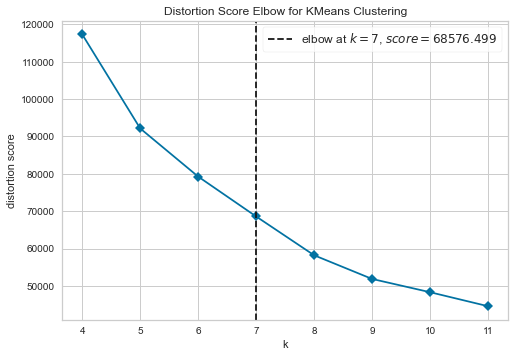

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [10]:
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

model = KMeans()

visualizer = KElbowVisualizer(model, k=(4,12), timings=False)
visualizer.fit(df_rfm_kmeans_std)
visualizer.poof()

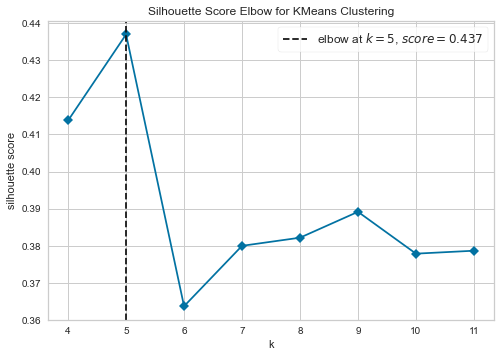

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [11]:
visualizer = KElbowVisualizer(model, k=(4,12), metric='silhouette', timings=False)
visualizer.fit(df_rfm_kmeans_std)
visualizer.poof()

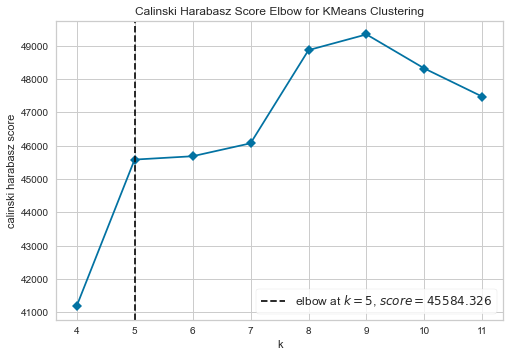

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [12]:
visualizer = KElbowVisualizer(model, k=(4,12), metric='calinski_harabasz', timings=False)
visualizer.fit(df_rfm_kmeans_std)
visualizer.poof()

In [13]:
model = KMeans(n_clusters=4)
kmeans = model.fit(df_rfm_kmeans_std)

In [22]:
#df_rfm_kmeans_std = pd.DataFrame(df_rfm_std , columns=df_rfm.columns)
df_rfm_kmeans['Label'] = kmeans.labels_

In [23]:
df_rfm_kmeans.sample(5)

,Recency,Frequency,MonetaryValue,Label
customer_unique_id,,,,
8f6e909d54c48380666fa71e01a13d3f,324,1,277.65,2
3880b8d94e3a64bca0e7df6c5f05c29a,371,1,60.94,1
9f8b3411938f604c87cde2e863e35d7b,217,1,106.07,0
9982b3c6a5d9b20533cf4827e3f2c0df,552,1,29.42,1
04badcbeea122a16bcab6bd3d47bf166,308,1,94.40,0


In [27]:
df_rfm_kmeans.groupby('Label').mean()

,Recency,Frequency,MonetaryValue
Label,,,
0,184.726327,1.040268,110.181501
1,446.691041,1.043962,110.046654
2,286.390627,1.117667,445.092852
3,300.349148,4.197080,191.412640


In [26]:
import plotly.express as px

fig = px.scatter_3d(df_rfm_kmeans,
                    x=df_rfm_kmeans['Recency'],
                    y=df_rfm_kmeans['Frequency'],
                    z=df_rfm_kmeans['MonetaryValue'],
                    color=df_rfm_kmeans['Label'])
fig.show()

![segments clients](https://miro.medium.com/max/736/1*MeXvFG4Ez0wStMDCXZyN-Q.png)